In [1]:
# Selecting libraries
import yfinance as yf
import pandas as pd
import numpy as np
import pyfolio as py
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings("ignore")

import cvxopt as opt
from cvxopt import blas, solvers

/opt/homebrew/Caskroom/miniforge/base/envs/thesis_2/lib/python3.10/site-packages/pyfolio/pos.py:26: UserWarning: Module "zipline.assets" not found; multipliers will not be applied to position notionals.
  warnings.warn(


In [169]:
# Define the assets and key initial metrics as investment amount to generate a portfolio

stocks = ['AAPL', 'MSFT', 'NVDA', 'JNJ', 'NVS','JPM','GS','AMZN','DIS','MCD','NEE','BA','CAT','XOM','CVX','RIO','BHP']
portfolio_value = 10**6                         # Initial Portfolio Value to be allocated in full
weights = [1/len(stocks)]*len(stocks)         # Weight Allocation per asset

benchmark = '^GSPC'                    # Which is your benchmark? ^GSPC is SP500 for Yfinance library

start_date = '2009-01-01'              # Start date for asset data download
live_date = '2015-01-01'               # Portfolio LIVE start date (for analytics)


# Warning handling
if len(weights) != len(stocks):
    print(sum((np.array(weights))))
    print('Number of Asset does not match weight allocated')
    
weight = round(sum((np.array(weights))))
if weight != 1.0:
    print(sum((np.array(weights))))
    print('Weight could not be allocated properly, make sure they sum 1.0')


In [170]:
# Download data, clean and isolate values for calculation
# If you use other data source, make sure the format is the same than stock_data.head() on next cell. Check dtypes by stock_data.info()

stock_data = yf.download(stocks, start=start_date)['Adj Close']
stock_data = stock_data.dropna()
stock_data = stock_data.reindex(columns=stocks)
stock_prices = stock_data[stocks].values

[*********************100%***********************]  17 of 17 completed


In [171]:
shares_df = pd.DataFrame(index=[stock_data.index[0]])

for s,w in zip(stocks, weights):
    shares_df[s + '_shares'] = np.floor((portfolio_value * np.array(w)) / stock_data[s][0])

shares_df    

,AAPL_shares,MSFT_shares,NVDA_shares,JNJ_shares,NVS_shares,JPM_shares,GS_shares,AMZN_shares,DIS_shares,MCD_shares,NEE_shares,BA_shares,CAT_shares,XOM_shares,CVX_shares,RIO_shares,BHP_shares
2009-01-02,21353.0,3888.0,29443.0,1485.0,2329.0,2670.0,855.0,21642.0,2855.0,1395.0,6984.0,1733.0,1872.0,1233.0,1359.0,6346.0,2555.0


### Process the MTL GARCH files.

In [172]:
import numpy as np
import pandas as pd
import os

# Define your file path
File_path = "../Output/assets/Drop000/"
Files = os.listdir(File_path)

def retrieve_var():
    # Initialize an empty DataFrame to store forecasts
    Forecasts = pd.DataFrame()

    # Loop through all files
    for file in Files:
        # Skip the ".DS_Store" file
        if file == ".DS_Store":
            continue

        path = os.path.join(File_path, file)
        asset_name = file.split('.')[0].split('_')[3]  # Assumes file name is the asset name

        asset = pd.read_csv(path)
        
        # Create a DataFrame with the asset names as columns and predicted variances as the values
        df = pd.DataFrame(asset['Forecast_T_ANN_ARCH'].values, columns=[asset_name])
        df['Date_Forecast'] = asset['Date_Forecast']

        # If Forecasts DataFrame is empty, assign df to it. Else, merge the new df with Forecasts on 'Date_Forecast'
        if Forecasts.empty:
            Forecasts = df
        else:
            Forecasts = pd.merge(Forecasts, df, how='outer', on='Date_Forecast')

    # Set 'Date_Forecast' as the index
    Forecasts.set_index('Date_Forecast', inplace=True)
    return Forecasts

# Save the DataFrame to CSV
std_data = retrieve_var()
# std_data.to_csv('master_forecasts.csv')


In [177]:
# std_data.index = pd.to_datetime(std_data.index)
# std_data = std_data * np.sqrt(21)
# std_data

vol_data = pd.read_csv('./test_vol.csv',index_col=0)

# month_vol = vol_data *np.sqrt(21)
# month_var = month_vol**2
# std_data = month_var.copy()
std_data = vol_data.copy()
std_data.index = pd.to_datetime(std_data.index)
std_data 
# convert to monthly volatilty

,AAPL,MSFT,NVDA,JNJ,NVS,JPM,GS,AMZN,DIS,MCD,NEE,BA,CAT,XOM,CVX,RIO,BHP
Date,,,,,,,,,,,,,,,,,
2009-01-05,0.476896,0.550362,0.729977,0.197488,0.268087,1.238276,0.962969,0.650271,0.487940,0.278631,0.256733,0.433030,0.571603,0.311552,0.370289,1.014954,0.715734
2009-01-06,0.466240,0.533433,0.715909,0.189684,0.260526,1.167202,0.904523,0.673319,0.487137,0.282192,0.254265,0.409635,0.553587,0.306201,0.352040,1.224725,0.723809
2009-01-07,0.459032,0.559907,0.727448,0.186365,0.245406,1.137966,0.883382,0.638562,0.500192,0.278754,0.247821,0.424829,0.561545,0.317472,0.400617,1.212027,0.779500
2009-01-08,0.448588,0.551764,0.711221,0.176873,0.245225,1.080677,0.831496,0.602266,0.486019,0.273789,0.237738,0.401896,0.543946,0.304392,0.378157,1.138304,0.734207
2009-01-09,0.443230,0.544658,0.718941,0.167631,0.272596,1.042005,0.786605,0.583590,0.479553,0.266995,0.251059,0.383062,0.531003,0.304239,0.370472,1.138869,0.698835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,0.337600,0.314669,0.547377,0.128221,0.150673,0.217768,0.239513,0.374497,0.367777,0.164467,0.208343,0.374487,0.270156,0.258593,0.279805,0.254076,0.263946
2022-12-27,0.332794,0.307335,0.592088,0.122705,0.147657,0.210566,0.235734,0.381079,0.363283,0.161378,0.198366,0.355130,0.268132,0.254357,0.272004,0.247839,0.258010
2022-12-28,0.343394,0.301539,0.575333,0.120122,0.145976,0.204848,0.226668,0.371191,0.364465,0.160029,0.196489,0.338729,0.268754,0.255713,0.269503,0.246646,0.260720


Each time you move the window forward one step, you should recalculate the volatility forecast for the next period and use it in your covariance matrix for the optimal portfolio weight calculation for that step.

The idea here is that you're trying to predict the optimal portfolio weights for the next period, based on the data you have up to and including the current period. Your GARCH model fits into this by giving you a forecasted volatility for the next period, which you then use in your weight optimization.

In [178]:
end_date = std_data.index[-1]
stock_data = stock_data.loc[:end_date]

In [179]:
window_length = 252 
df = stock_data.copy()
start_date = df.index[window_length]
stock_data = stock_data.loc[start_date:]
shares_df = shares_df.loc[start_date:]


In [181]:
import pandas as pd
import numpy as np
from pypfopt.efficient_frontier import EfficientFrontier
from pypfopt import risk_models
from pypfopt import expected_returns

# Set the number of assets, assumed that 'df' is your DataFrame with historical prices.
df = stock_data.copy()
num_assets = len(df.columns)
stocks = df.columns

# Cred portfolio weights over time
optimal_weights_df = pd.DataFrame(index=df.index, columns=stocks)

# Set the window length for the rolling covariance calculation
window_length = 252  # Use 252 for approx one year of trading days

# Set the initial weights to be equal for all assets
initial_weights = np.array([1/num_assets]*num_assets)

for end_date in df.index[window_length:]:
    
    # Extract the window of data
    data_window = df.loc[:end_date].tail(window_length)
    
    # Calculate expected returns and covariance matrix for the window
    mu = expected_returns.mean_historical_return(data_window)

    # Get the date of the next period
    future_dates = df.index[df.index > end_date]
    if len(future_dates) > 0:
        next_period_date = future_dates[0]
    else:
        break
    # Get the date of the next period
    next_period_date = df.index[df.index > end_date][0]
    
    # Get the date of the closest week in the std_data dataframe
    closest_week_date = std_data.index[std_data.index.get_loc(next_period_date, method='nearest')]

    # Get the volatility data for the closest week
    std_data_next = std_data.loc[closest_week_date]

    
    # replace diagonal elements of cov matrix by GARCH-predicted variance.

    S =  risk_models.sample_cov(data_window)
    S_adj =  S.copy()
    for symbols in stocks:
        S_adj[symbols][symbols] = std_data_next[symbols]**(1/2) #Volatility = Variance^1/2 = Standard Deviation
    
    # Initialise and optimize the portfolio on the window of data
    ef = EfficientFrontier(mu, S_adj, weight_bounds=(0, 1))  # Set bounds to allow shorting
    raw_weights = ef.max_sharpe()  # Optimize for maximal Sharpe ratio
    cleaned_weights = ef.clean_weights()  # Clean the raw weights
    
    # Add the weights to our optimal_weights dataframe
    optimal_weights_df.loc[end_date] = [cleaned_weights.get(stock) for stock in stocks]

# Forward fill the weights for the days we aren't rebalancing
optimal_weights_df = optimal_weights_df.fillna(method='ffill')

# Print out the final DataFrame
print(optimal_weights_df.tail())


            AAPL  MSFT  NVDA      JNJ      NVS  JPM   GS  AMZN  DIS  MCD  NEE  \
Date                                                                            
2022-12-23   0.0   0.0   0.0  0.04405  0.03319  0.0  0.0   0.0  0.0  0.0  0.0   
2022-12-27   0.0   0.0   0.0  0.03643  0.02613  0.0  0.0   0.0  0.0  0.0  0.0   
2022-12-28   0.0   0.0   0.0  0.02545  0.02677  0.0  0.0   0.0  0.0  0.0  0.0   
2022-12-29   0.0   0.0   0.0  0.02341  0.04062  0.0  0.0   0.0  0.0  0.0  0.0   
2022-12-30   0.0   0.0   0.0  0.02341  0.04062  0.0  0.0   0.0  0.0  0.0  0.0   

             BA      CAT      XOM      CVX      RIO      BHP  
Date                                                          
2022-12-23  0.0  0.01131  0.57583  0.28548  0.00669  0.04344  
2022-12-27  0.0  0.01551  0.56754  0.28445  0.01372  0.05621  
2022-12-28  0.0  0.00129  0.60433  0.29802  0.00741  0.03673  
2022-12-29  0.0  0.00429  0.59709  0.29737  0.00000  0.03722  
2022-12-30  0.0  0.00429  0.59709  0.29737  0.00000  0

In [182]:
optimal_weights_df

,AAPL,MSFT,NVDA,JNJ,NVS,JPM,GS,AMZN,DIS,MCD,NEE,BA,CAT,XOM,CVX,RIO,BHP
Date,,,,,,,,,,,,,,,,,
2011-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-01-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,0.0,0.0,0.0,0.04405,0.03319,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01131,0.57583,0.28548,0.00669,0.04344
2022-12-27,0.0,0.0,0.0,0.03643,0.02613,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01551,0.56754,0.28445,0.01372,0.05621
2022-12-28,0.0,0.0,0.0,0.02545,0.02677,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00129,0.60433,0.29802,0.00741,0.03673


In [183]:
start_date = df.index[window_length]
stock_data = stock_data.loc[start_date:]
shares_df = shares_df.loc[start_date:]
optimal_weights_df = optimal_weights_df.loc[start_date:]


In [184]:
shares_df = pd.DataFrame(index=[stock_data.index[0]])

for s,w in zip(stocks, weights):
    shares_df[s + '_shares'] = np.floor((portfolio_value * np.array(w)) / stock_data[s][0])

shares_df    

,AAPL_shares,MSFT_shares,NVDA_shares,JNJ_shares,NVS_shares,JPM_shares,GS_shares,AMZN_shares,DIS_shares,MCD_shares,NEE_shares,BA_shares,CAT_shares,XOM_shares,CVX_shares,RIO_shares,BHP_shares
2012-01-03,4712.0,2753.0,18265.0,1233.0,1756.0,2320.0,753.0,6571.0,1714.0,816.0,5455.0,968.0,856.0,1088.0,848.0,2395.0,1433.0


In [185]:
# initialize variables
balance_year = stock_data.index[0].year
balance_month = stock_data.index[0].month
signal = False
count = 0    # for loop count purpose

# Store previous values in a dictionary
prev_values = {}

# Calculate portfolio value for the first day
portfolio_value = sum([shares_df.loc[stock_data.index[0], s + '_shares'] * stock_data.loc[stock_data.index[0], s] for s in stocks])

for day in stock_data.index:
    count += 1
    if day == stock_data.index[0]:
        shares_df.loc[day] = shares_df.loc[day] # First day

        # Store initial values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]


    elif day.month != balance_month:
        signal = True

        # get the weights for the current period
        weights = optimal_weights_df.loc[day]

        # calculate new shares based on the new portfolio value and weights
        new_shares = [np.floor((portfolio_value * w) / stock_data[s][day]) for s,w in zip(stocks, weights)]
        shares_df.loc[day, :] = new_shares

        balance_year = day.year
        balance_month = day.month
        count += 1

        # Store new values as previous values
        for col in shares_df.columns:
            prev_values[col] = shares_df.loc[day, col]

    else:

        signal = False

        # Use previous values if it is not a rebalancing date
        shares_df.loc[day, :] = [prev_values[col] for col in shares_df.columns]

    # Calculate asset values and portfolio value for the current day
    asset_values = [shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s] for s in stocks]
    portfolio_value = sum(asset_values)
    
    stock_data.loc[day, 'Signal'] = signal
    stock_data.loc[day, 'Portfolio_Value'] = portfolio_value
    
    # Add shares to stock data frame
    for s in stocks:
        stock_data.loc[day, s + '_shares'] = shares_df.loc[day, s + '_shares']
        stock_data.loc[day, s + '_value'] = shares_df.loc[day, s + '_shares'] * stock_data.loc[day, s]


In [186]:
# Calculate log returns for portfolio
stock_data['Portfolio_Value_rets'] = np.log(stock_data['Portfolio_Value'] / stock_data['Portfolio_Value'].shift(1))

# Calculate log returns for each stock
for stock in stocks:
    stock_data[f'{stock}_rets'] = np.log(stock_data[stock] / stock_data[stock].shift(1))

In [187]:
start_date_benchmark = stock_data.index[0]
stock_data = stock_data.dropna()

In [188]:
# Calculate daily weight per asset
for s in stocks:
    stock_data[s + '_weight'] = stock_data[s + '_value'] / stock_data['Portfolio_Value']

In [189]:
stock_data.filter(regex='weight')

,AAPL_weight,MSFT_weight,NVDA_weight,JNJ_weight,NVS_weight,JPM_weight,GS_weight,AMZN_weight,DIS_weight,MCD_weight,NEE_weight,BA_weight,CAT_weight,XOM_weight,CVX_weight,RIO_weight,BHP_weight
Date,,,,,,,,,,,,,,,,,
2012-01-04,0.058994,0.060062,0.059349,0.058299,0.058425,0.059042,0.058288,0.058181,0.059477,0.058947,0.058525,0.058734,0.059160,0.058655,0.058532,0.058637,0.058694
2012-01-05,0.059449,0.060472,0.061274,0.058032,0.057756,0.060073,0.057994,0.058018,0.060269,0.059009,0.059072,0.057906,0.059378,0.058282,0.057764,0.057859,0.057394
2012-01-06,0.060108,0.061450,0.060604,0.057562,0.057642,0.059572,0.057319,0.059690,0.060933,0.059502,0.058484,0.058298,0.059564,0.057884,0.057382,0.057303,0.056703
2012-01-09,0.060014,0.060642,0.060605,0.057652,0.057331,0.059472,0.058099,0.058367,0.060690,0.058935,0.058555,0.058732,0.060399,0.058143,0.058008,0.057450,0.056907
2012-01-10,0.059652,0.060278,0.059778,0.057338,0.056713,0.060154,0.059755,0.058061,0.059928,0.058406,0.058250,0.058537,0.061583,0.057735,0.057228,0.058683,0.057921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-23,0.000000,0.000000,0.000000,0.103656,0.077251,0.000000,0.000000,0.000000,0.000000,0.049592,0.000000,0.000000,0.011506,0.447496,0.261540,0.000000,0.048959
2022-12-27,0.000000,0.000000,0.000000,0.102574,0.076685,0.000000,0.000000,0.000000,0.000000,0.048954,0.000000,0.000000,0.011544,0.449105,0.262138,0.000000,0.049001
2022-12-28,0.000000,0.000000,0.000000,0.103496,0.077464,0.000000,0.000000,0.000000,0.000000,0.049288,0.000000,0.000000,0.011518,0.447641,0.261728,0.000000,0.048865


In [190]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=shares_df[stock+'_shares'], mode='lines', name=stock+'_shares'))

fig.update_layout(title='Shares per day',
                  xaxis_title='Date',
                  yaxis_title='Shares',
                  width=800,
                  height=400)

fig.show()

In [191]:
fig = go.Figure()

# Loop through each stock and add a trace for its shares
for stock in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[stock + '_weight'], mode='lines', name=stock + '_weight'))

fig.update_layout(title='Weights per day',
                  xaxis_title='Date',
                  yaxis_title='Weights',
                  width=1000,
                  height=600)

fig.show()

In [192]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Create subplot layout
fig = make_subplots(rows=2, cols=2, subplot_titles=('Portfolio Returns', 'Asset Returns', 'Shares Holding per Asset', 'Weights per Asset'))

# Add traces to the subplots
fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data['Portfolio_Value_rets'].cumsum(), name='Portfolio'), row=1, col=1)

for s in stocks:
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_rets'].cumsum(), name=f'{s}'), row=1, col=2)
    fig.add_trace(go.Scatter(x=shares_df.index, y=shares_df[f'{s}_shares'], name=f'{s}'), row=2, col=1)
    fig.add_trace(go.Scatter(x=stock_data.index, y=stock_data[f'{s}_weight'], name=f'{s}'), row=2, col=2)

# Update subplot layout
fig.update_layout(height=800, width=1200, title='Strategy Overview', showlegend=False)

# Display the plot
fig.show()


In [193]:
# Benchmark data download and returns
start_date_benchmark = stock_data.index[0]
benchmark_data = yf.download(benchmark, start=start_date_benchmark)
benchmark_data = benchmark_data.dropna()
benchmark_data['benchmark_rets'] = np.log(benchmark_data['Adj Close'] / benchmark_data['Adj Close'].shift(1))
benchmark_data['benchmark_rets'] = benchmark_data['benchmark_rets'].dropna()

[*********************100%***********************]  1 of 1 completed


In [194]:
# Data timezone unification for pyfolio valuation
if stock_data.index.tz is None:
    stock_data.index = stock_data.index.tz_localize('UTC')
else:
    stock_data.index = stock_data.index.tz_convert('UTC')

if benchmark_data.index.tz is None:
    benchmark_data.index = benchmark_data.index.tz_localize('UTC')
else:
    benchmark_data.index = benchmark_data.index.tz_convert('UTC')

# Convert live_date to a datetime object, then localize or convert as needed.
live_date = pd.to_datetime(live_date)
if live_date.tzinfo is None:
    live_date = live_date.tz_localize('UTC')
else:
    live_date = live_date.tz_convert('UTC')



Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,37.62,2020-02-19,2020-03-23,2020-05-20,66
1,28.66,2018-08-29,2018-12-24,2019-12-16,339
2,24.67,2022-03-29,2022-07-14,NaT,NaN
3,19.04,2015-12-29,2016-02-08,2016-05-13,99
4,17.47,2020-09-02,2021-03-24,2022-03-29,410


AttributeError: 'Axes' object has no attribute 'is_last_row'

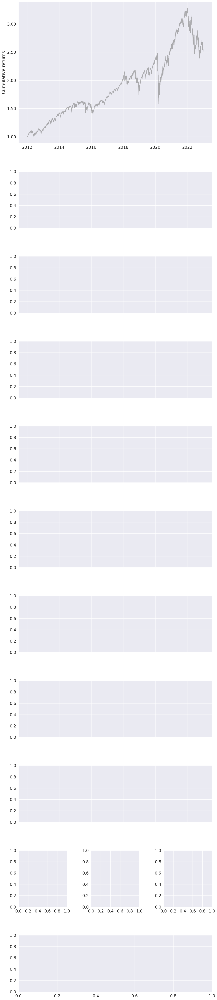

In [195]:
py.create_full_tear_sheet(stock_data['Portfolio_Value_rets'], benchmark_rets = benchmark_data['benchmark_rets'], live_start_date = live_date)